Name: Necat Kılıçarslan
Student Id: 2380624

### Task 1: Naive Formula + Uniform Weighting

The run time of the agac.png is 3.524 seconds.
The run time of the agacrotated.png is 3.519 seconds.
The run time of the chessboard.png is 3.668 seconds.
The run time of the chessboardrotated.png is 3.834 seconds.
The run time of the lab.png is 4.018 seconds.
The run time of the labrotated.png is 4.055 seconds.


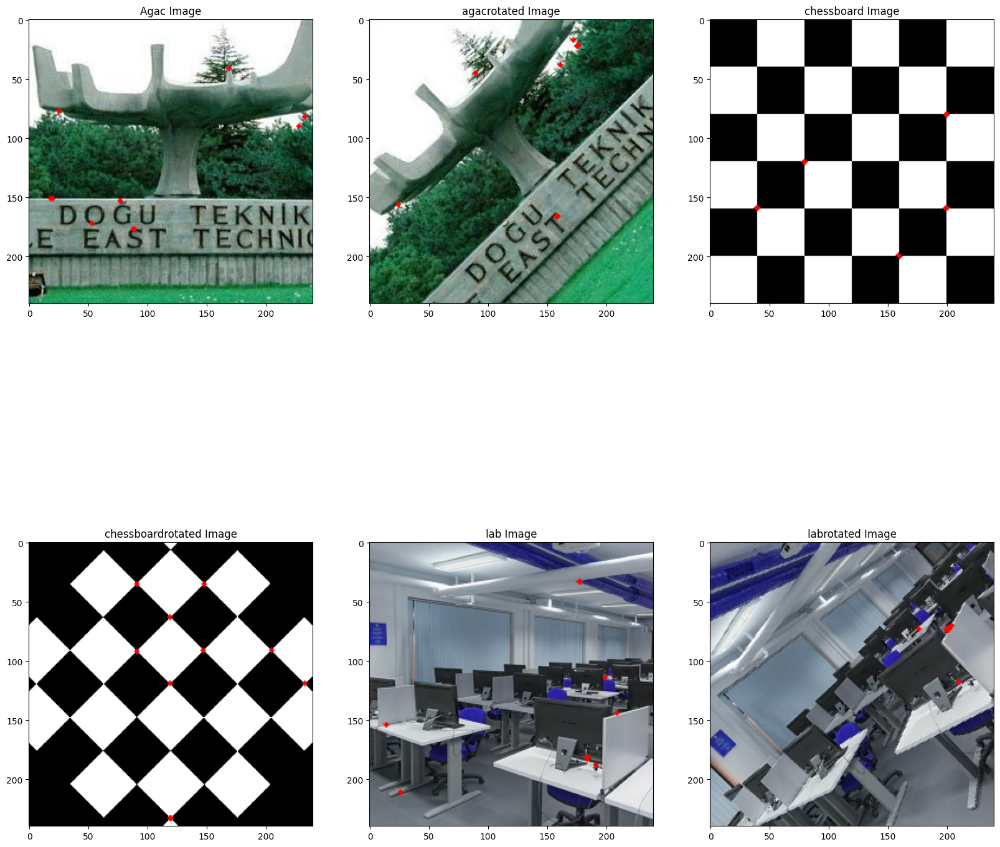

In [23]:
# implement harris corner detection algorithm

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')


# append all image to list

def naive_uniform(original_img):
    # copy the image
    img_copy = original_img.copy()
    # cvtColor to convert to grayscale
    gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
    # naive implementation of uniform filter
    # 3x3 uniform filter
    # pad the image with zeros
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # loop through the image
    for i in range(1, gray.shape[0] - 3):
        for j in range(1, gray.shape[1] - 3):
            # get the 3x3 window
            tmp_val = 0
            window = gray[i:i + 3, j:j + 3]
            for x in range(-1, 2):
                for y in range(-1, 2):
                    # get the new 3x3 window
                    tmp_window = gray[i + x:i + x + 3, j + y:j + y + 3]
                    # get the difference between the two windows then take the square and sum adn assign temp value
                    tmp_val += np.sum(np.square(window - tmp_window))
            # assign the value to the result image
            result_img[i + 1, j + 1] = tmp_val
    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img_copy, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img_copy


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(naive_uniform(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(naive_uniform(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(naive_uniform(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(naive_uniform(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(naive_uniform(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(naive_uniform(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))



## This part is for discussion
In this task, I implemented the naive formula which takes lots of time to run the algorithm. Also, in this task, I did not implement the non-maximum suppression to the pictures as stated in the pdf. Although I did not implement the non maximum supression, the needed time to detect the corners takes so much time and also the algorithm sometimes find very close corner points. In fact, the algorithm finds 10 different corners, but since the corners are very close to each other because we did not apply non-maximum suppression, it seems like we found fewer than 10 points. Looking at the pictures, we can easily realize that this algorithm gives us rotation-variant results.

In [3]:
### Task2: Naive Formula + Uniform Weighting + Non-Maximum Suppression

The run time of the agac.png is 4.022 seconds.
The run time of the agacrotated.png is 3.997 seconds.
The run time of the chessboard.png is 4.007 seconds.
The run time of the chessboardrotated.png is 3.851 seconds.
The run time of the lab.png is 4.473 seconds.
The run time of the labrotated.png is 4.529 seconds.


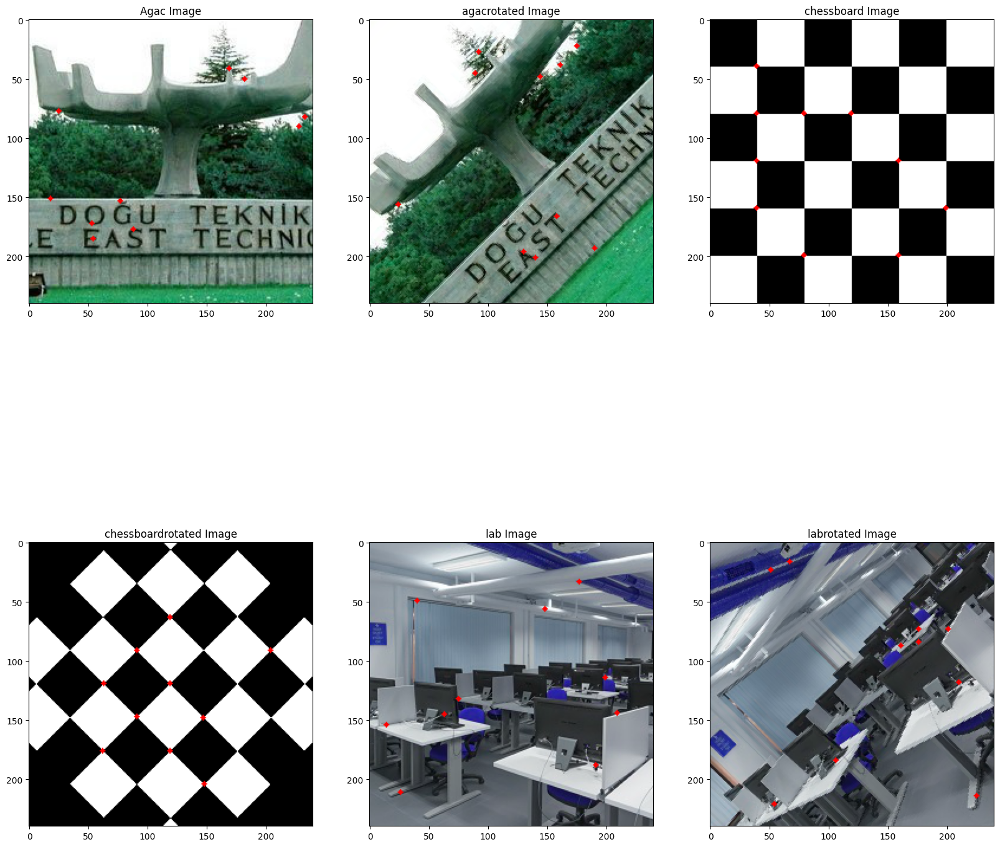

In [22]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')


# append all image to list

def naive_uniform_with_non_maximum(original_img):
    # copy the image
    img_copy = original_img.copy()
    # cvtColor to convert to grayscale
    gray = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # loop through the image
    for i in range(1, gray.shape[0] - 3):
        for j in range(1, gray.shape[1] - 3):
            # get the 3x3 window
            tmp_val = 0
            window = gray[i:i + 3, j:j + 3]
            for x in range(-1, 2):
                for y in range(-1, 2):
                    # get the new 3x3 window
                    tmp_window = gray[i + x:i + x + 3, j + y:j + y + 3]
                    # get the difference between the two windows then take the square and sum adn assign temp value
                    tmp_val += np.sum(np.square(window - tmp_window))
            # assign the value to the result image
            result_img[i + 1, j + 1] = tmp_val
    # take the len of result image
    len_result = len(result_img)
    for i in range(0,len_result-8):
        for j in range(0,len_result-8):
            max_val = np.max(result_img[i:i+8, j:j+8])
            # keep maximum value in the 8x8 window and assign 0 to the rest
            result_img[i:i + 8, j:j + 8][result_img[i:i + 8, j:j + 8] < max_val] = 0
            # iterate over the window take the maximum value index and store them
            if np.count_nonzero(result_img[i:i + 8, j:j + 8]) > 1:
                flag = True
                for k in range(0,8):
                    for l in range(0,8):
                        if result_img[i+k,j+l] == max_val and flag:
                            flag = False
                            continue
                        else:
                            result_img[i+k,j+l] = 0

    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img_copy, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img_copy


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(naive_uniform_with_non_maximum(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(naive_uniform_with_non_maximum(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(naive_uniform_with_non_maximum(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(naive_uniform_with_non_maximum(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(naive_uniform_with_non_maximum(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(naive_uniform_with_non_maximum(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))

## This part is for discussion
In this task, I implemented the naive formula with non-maximum suppression. With the help of the non-maximum suppression, now our algorithm can find them a little bit far away not the very close corners, and we can easily conclude that result from our resulted image figures. In this task, the total time has increased a little, since we additionally applied non-maximum
suppression. Moreover, we can easily observe that from the resulting figure, the algorithm gives us rotation-variant results.

### Task3: Taylor's Approximation + Uniform Weighting + Non-Maximum Suppression

The run time of the agac.png is 3.588 seconds.
The run time of the agacrotated.png is 3.658 seconds.
The run time of the chessboard.png is 4.113 seconds.
The run time of the chessboardrotated.png is 5.223 seconds.
The run time of the lab.png is 4.356 seconds.
The run time of the labrotated.png is 3.965 seconds.


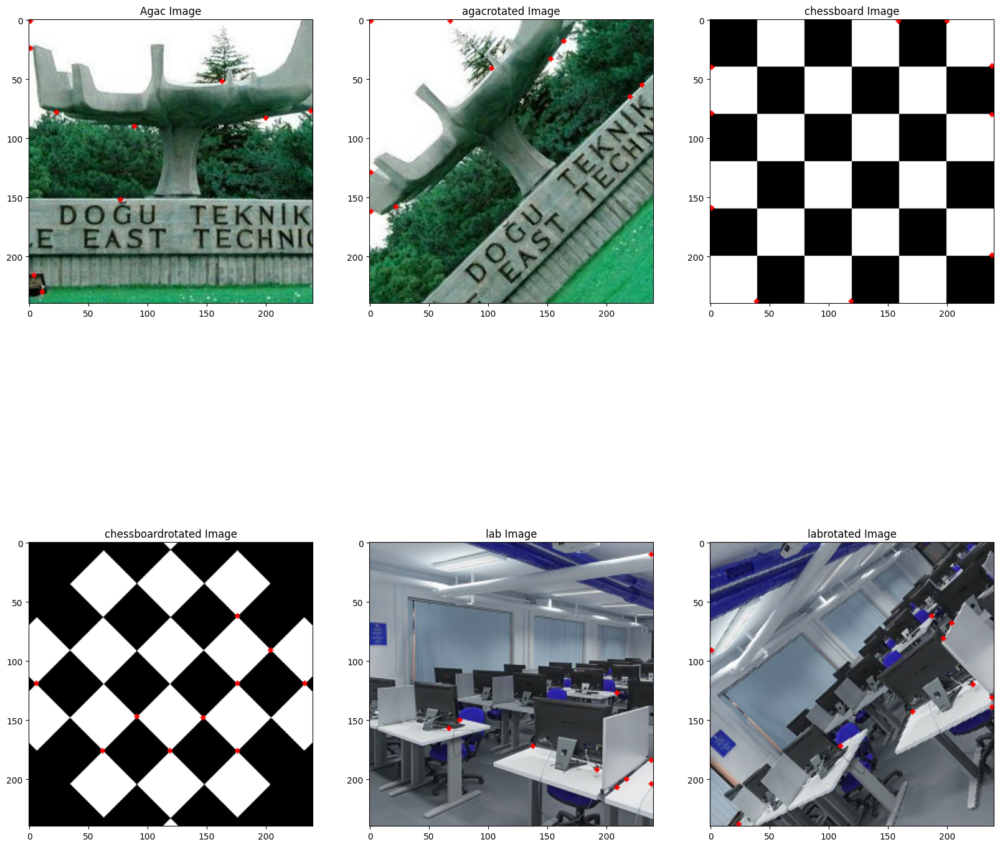

In [30]:
# implement harris corner detection algorithm

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')


# append all image to list

def taylor_uniform(img):
    # copy image
    img = img.copy()
    # convert image to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # create the sobel filter
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    # apply the sobel filter to image
    Ix = scipy.signal.convolve2d(gray, sobel_x, mode='same')
    Iy = scipy.signal.convolve2d(gray, sobel_y, mode='same')
    # calculate the taylor matrix
    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # iterate over the window
    for i in range(0, gray.shape[0] - 2):
        for j in range(0, gray.shape[1] - 2):
            tmp_value = 0
            # take the window
            window_Ix2 = Ix2[i:i + 3, j:j + 3]
            window_Iy2 = Iy2[i:i + 3, j:j + 3]
            window_Ixy = Ixy[i:i + 3, j:j + 3]
            # calculate the taylor matrix
            M2 = np.array([[np.sum(window_Ix2), np.sum(window_Ixy)],[np.sum(window_Ixy), np.sum(window_Iy2)]])
            # multiply the taylor matrix with the window with np.matmul
            tmp_value += np.matmul(np.matmul(np.array([-1, -1]), M2), np.array([-1, -1]).T)
            tmp_value += np.matmul(np.matmul(np.array([-1, 1]), M2), np.array([-1, 1]).T)
            tmp_value += np.matmul(np.matmul(np.array([1, -1]), M2), np.array([1, -1]).T)
            tmp_value += np.matmul(np.matmul(np.array([1, 1]), M2), np.array([1, 1]).T)
            # store the result
            result_img[i + 1, j + 1] = tmp_value
    # take the len of result image
    len_result = len(result_img)
    for i in range(0,len_result-8):
        for j in range(0,len_result-8):
            max_val = np.max(result_img[i:i+8, j:j+8])
            # keep maximum value in the 8x8 window and assign 0 to the rest
            result_img[i:i + 8, j:j + 8][result_img[i:i + 8, j:j + 8] < max_val] = 0
            # iterate over the window take the maximum value index and store them
            if np.count_nonzero(result_img[i:i + 8, j:j + 8]) > 1:
                flag = True
                for k in range(0,8):
                    for l in range(0,8):
                        if result_img[i+k,j+l] == max_val and flag:
                            flag = False
                            continue
                        else:
                            result_img[i+k,j+l] = 0

    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(taylor_uniform(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(taylor_uniform(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(taylor_uniform(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(taylor_uniform(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(taylor_uniform(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(taylor_uniform(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))

## This part is for discussion
In this task, I implemented the Taylor approximation with non-maximum suppression. Actually, this task is an approximation of the
Task1. Since this is an approximation with non-maximum suppression, the speed is a little bit increased as we expected. And again
since I implemented the non-maximum suppression, the corners are not very close to each other. Also, we can easily see that from the figures, the algorithm gives us the rotation-variant result.

### Task 4: Smaller Eigenvalue as corner score + Uniform Weighting + Non-Maximum Suppression

The run time of the agac.png is 3.952 seconds.
The run time of the agacrotated.png is 4.036 seconds.
The run time of the chessboard.png is 3.658 seconds.
The run time of the chessboardrotated.png is 3.604 seconds.
The run time of the lab.png is 3.820 seconds.
The run time of the labrotated.png is 3.859 seconds.


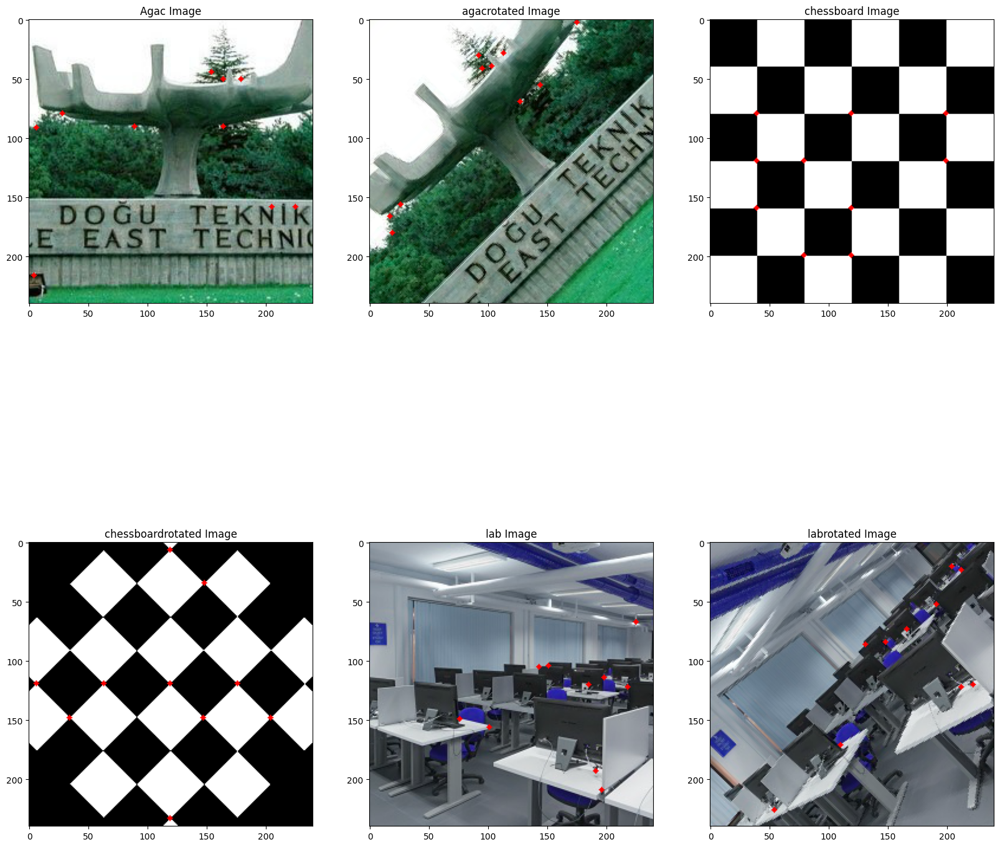

In [26]:
# implement harris corner detection algorithm

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')


# append all image to list

def smaller_eigenvalue(img):
    # copy image
    img = img.copy()
    # convert image to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # create the sobel filter
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    # apply the sobel filter to image
    Ix = scipy.signal.convolve2d(gray, sobel_x, mode='same', boundary='symm')
    Iy = scipy.signal.convolve2d(gray, sobel_y, mode='same', boundary='symm')
    # calculate the taylor matrix
    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # iterate over the window
    for i in range(0, gray.shape[0] - 2):
        for j in range(0, gray.shape[1] - 2):

            tmp_value = 0
            # take the window
            window_Ix2 = Ix2[i:i + 3, j:j + 3]
            window_Iy2 = Iy2[i:i + 3, j:j + 3]
            window_Ixy = Ixy[i:i + 3, j:j + 3]
            # calculate the taylor matrix
            M2 = np.array([[np.sum(window_Ix2), np.sum(window_Ixy)],[np.sum(window_Ixy), np.sum(window_Iy2)]])
            # multiply the taylor matrix with the window with np.matmul
            # find the eigenvalues of the matrix
            eigenvalues = np.linalg.eigvals(M2)
            # take the minimum eigenvalue
            tmp_value = np.min(eigenvalues)
            # check for the threshold value
            if tmp_value > 2.5:
                # store the result
                result_img[i + 1, j + 1] = tmp_value
            
    # take the len of result image
    len_result = len(result_img)
    for i in range(0,len_result-8):
        for j in range(0,len_result-8):
            max_val = np.max(result_img[i:i+8, j:j+8])
            # keep maximum value in the 8x8 window and assign 0 to the rest
            result_img[i:i + 8, j:j + 8][result_img[i:i + 8, j:j + 8] < max_val] = 0
            # iterate over the window take the maximum value index and store them
            if np.count_nonzero(result_img[i:i + 8, j:j + 8]) > 1:
                flag = True
                for k in range(0,8):
                    for l in range(0,8):
                        if result_img[i+k,j+l] == max_val and flag:
                            flag = False
                            continue
                        else:
                            result_img[i+k,j+l] = 0

    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(smaller_eigenvalue(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(smaller_eigenvalue(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(smaller_eigenvalue(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(smaller_eigenvalue(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(smaller_eigenvalue(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(smaller_eigenvalue(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))



## This part is for discussion
In this task, I implemented the smaller eigenvalue approach with non-maximum suppression. Again since I implemented the non-maximum suppression, the corners are not very close to each other. In this task, we calculate the H matrix and then find the eigenvalues of that matrix. And then we choose the minimum of them. After doing these steps, we check the threshold value. Since this task is not very distinct from task 3, according to the implementation added just 2 3 new computation lines,  we get a similar speed.

### Task 5: R function as corner score + Uniform Weighting + Non-Maximum Suppression

The run time of the agac.png is 2.253 seconds.
The run time of the agacrotated.png is 2.427 seconds.
The run time of the chessboard.png is 2.395 seconds.
The run time of the chessboardrotated.png is 2.438 seconds.
The run time of the lab.png is 2.533 seconds.
The run time of the labrotated.png is 2.463 seconds.


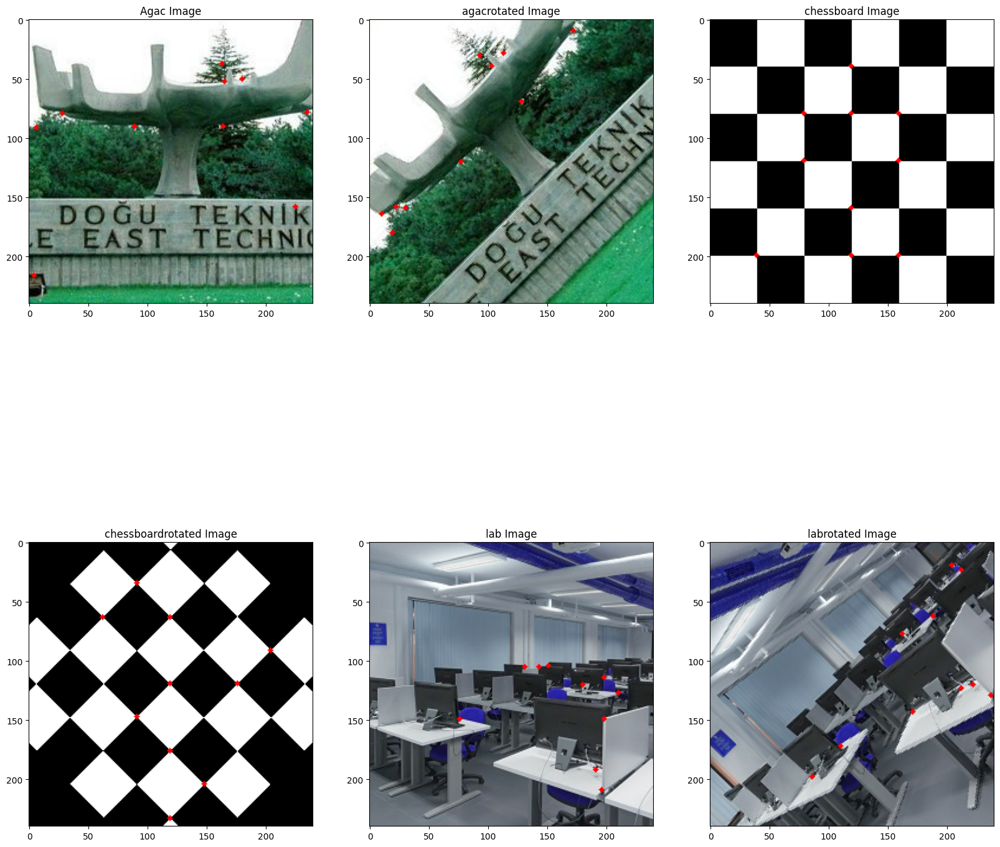

In [14]:
# implement harris corner detection algorithm

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')


# append all image to list

def r_function(img):
    # copy image
    img = img.copy()
    # convert image to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # create the sobel filter
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    # apply the sobel filter to image
    Ix = scipy.signal.convolve2d(gray, sobel_x, mode='same', boundary='symm')
    Iy = scipy.signal.convolve2d(gray, sobel_y, mode='same', boundary='symm')
    # calculate the taylor matrix
    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # iterate over the window
    for i in range(0, gray.shape[0] - 2):
        for j in range(0, gray.shape[1] - 2):

            tmp_value = 0
            # take the window
            window_Ix2 = Ix2[i:i + 3, j:j + 3]
            window_Iy2 = Iy2[i:i + 3, j:j + 3]
            window_Ixy = Ixy[i:i + 3, j:j + 3]
            # To measure the corner strength of a pixel R = det(H) – k(trace(H))2 where H is the Hessian matrix and k is a constant.
            # calculate the taylor matrix
            M2 = np.array([[np.sum(window_Ix2), np.sum(window_Ixy)],[np.sum(window_Ixy), np.sum(window_Iy2)]])
            # do the harris corner detection formula
            tmp_value = np.linalg.det(M2) - 0.04 * (np.trace(M2) ** 2)

            # store the result
            result_img[i + 1, j + 1] = tmp_value
    # take the len of result image
    len_result = len(result_img)
    for i in range(0,len_result-8):
        for j in range(0,len_result-8):
            max_val = np.max(result_img[i:i+8, j:j+8])
            # keep maximum value in the 8x8 window and assign 0 to the rest
            result_img[i:i + 8, j:j + 8][result_img[i:i + 8, j:j + 8] < max_val] = 0
            # iterate over the window take the maximum value index and store them
            if np.count_nonzero(result_img[i:i + 8, j:j + 8]) > 1:
                flag = True
                for k in range(0,8):
                    for l in range(0,8):
                        if result_img[i+k,j+l] == max_val and flag:
                            flag = False
                            continue
                        else:
                            result_img[i+k,j+l] = 0

    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(r_function(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(r_function(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(r_function(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(r_function(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(r_function(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(r_function(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))




## This part is for discussion
In this task, I implemented the R function as a corner score with non-maximum suppression. Again since Implemented the non-maximum suppression the chosen points are far away from each other not very close. Since we omit the 2 3 calculations line different from task 5, and implement the R function as in our slides, the speed of the detection is increased. In addition, our algorithm has now started to find better corners.

### Task 6: R function with fast windowing based on fitering + Uniform Weighting + Non-Maximum Suppression

The run time of the agac.png is 0.745 seconds.
The run time of the agacrotated.png is 0.921 seconds.
The run time of the chessboard.png is 0.790 seconds.
The run time of the chessboardrotated.png is 0.767 seconds.
The run time of the lab.png is 0.832 seconds.
The run time of the labrotated.png is 0.980 seconds.


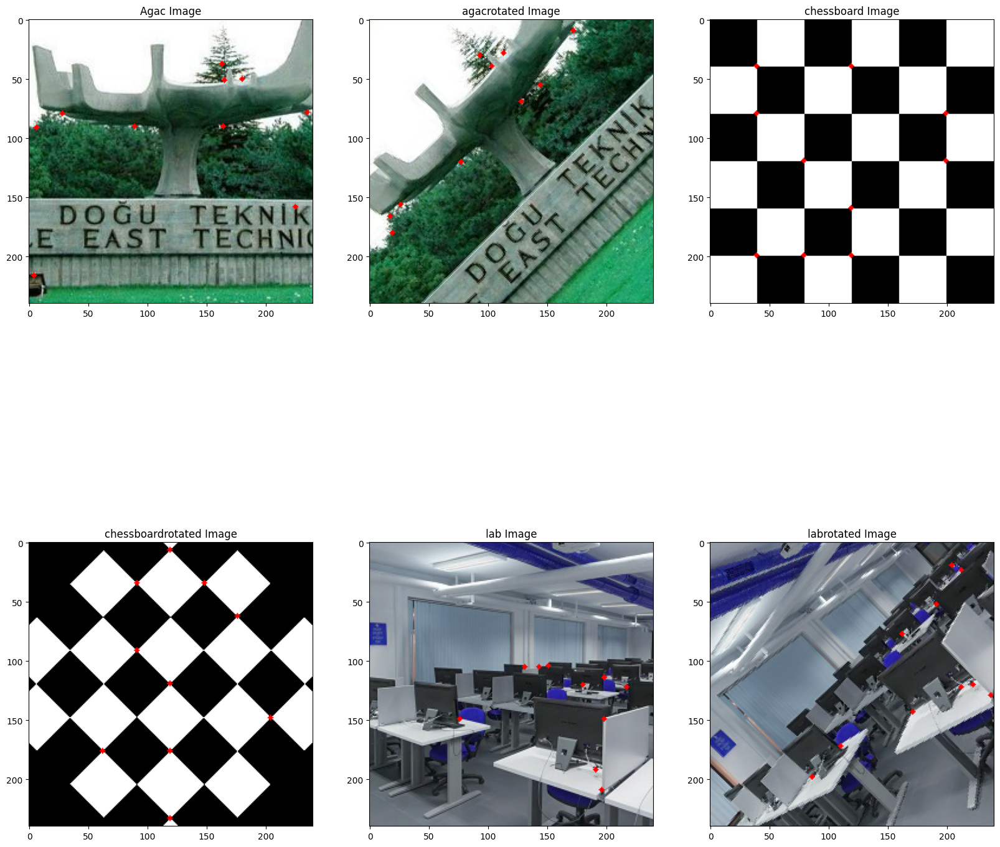

In [31]:
# implement harris corner detection algorithm

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')


# append all image to list

def r_function_with_fast_impl(img):
    # copy image
    img = img.copy()
    # convert image to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # create the sobel filter
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    # apply the sobel filter to image
    Ix = scipy.signal.convolve2d(gray, sobel_x, mode='same', boundary='symm')
    Iy = scipy.signal.convolve2d(gray, sobel_y, mode='same', boundary='symm')
    # calculate the taylor matrix
    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # iterate over the window
    # do the haris corner detection with faster way
    x2_conv = scipy.signal.convolve2d(Ix2, np.ones((3, 3)), mode='same')
    y2_conv = scipy.signal.convolve2d(Iy2, np.ones((3, 3)), mode='same')
    xy_conv = scipy.signal.convolve2d(Ixy, np.ones((3, 3)), mode='same')
    # do the haris corner detection with faster way without using for loop
    result_img = x2_conv * y2_conv - xy_conv ** 2 - 0.04 * (x2_conv + y2_conv) ** 2
    # take the len of result image
    len_result = len(result_img)
    for i in range(0,len_result-8):
        for j in range(0,len_result-8):
            max_val = np.max(result_img[i:i+8, j:j+8])
            # keep maximum value in the 8x8 window and assign 0 to the rest
            result_img[i:i + 8, j:j + 8][result_img[i:i + 8, j:j + 8] < max_val] = 0
            # iterate over the window take the maximum value index and store them
            if np.count_nonzero(result_img[i:i + 8, j:j + 8]) > 1:
                flag = True
                for k in range(0,8):
                    for l in range(0,8):
                        if result_img[i+k,j+l] == max_val and flag:
                            flag = False
                            continue
                        else:
                            result_img[i+k,j+l] = 0

    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(r_function_with_fast_impl(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(r_function_with_fast_impl(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(r_function_with_fast_impl(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(r_function_with_fast_impl(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(r_function_with_fast_impl(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(r_function_with_fast_impl(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))



## This part is for discussion
In this task, I implemented the R function with fast windowing based on filtering with non-maximum suppression. Again since I used the non-maximum suppression the corners are far away from each other. In this task, our speed increased too much, this is the best speed I get from Task 1 to Task 6. Since in this task instead of iterating over the window, we use the convolution, the speed increased too much.

### Task 7: R function with fast windowing based on fitering + Gaussian Weighting + Non-Maximum Suppression

The run time of the agac.png is 0.551 seconds.
The run time of the agacrotated.png is 0.574 seconds.
The run time of the chessboard.png is 0.529 seconds.
The run time of the chessboardrotated.png is 0.536 seconds.
The run time of the lab.png is 0.539 seconds.
The run time of the labrotated.png is 0.549 seconds.


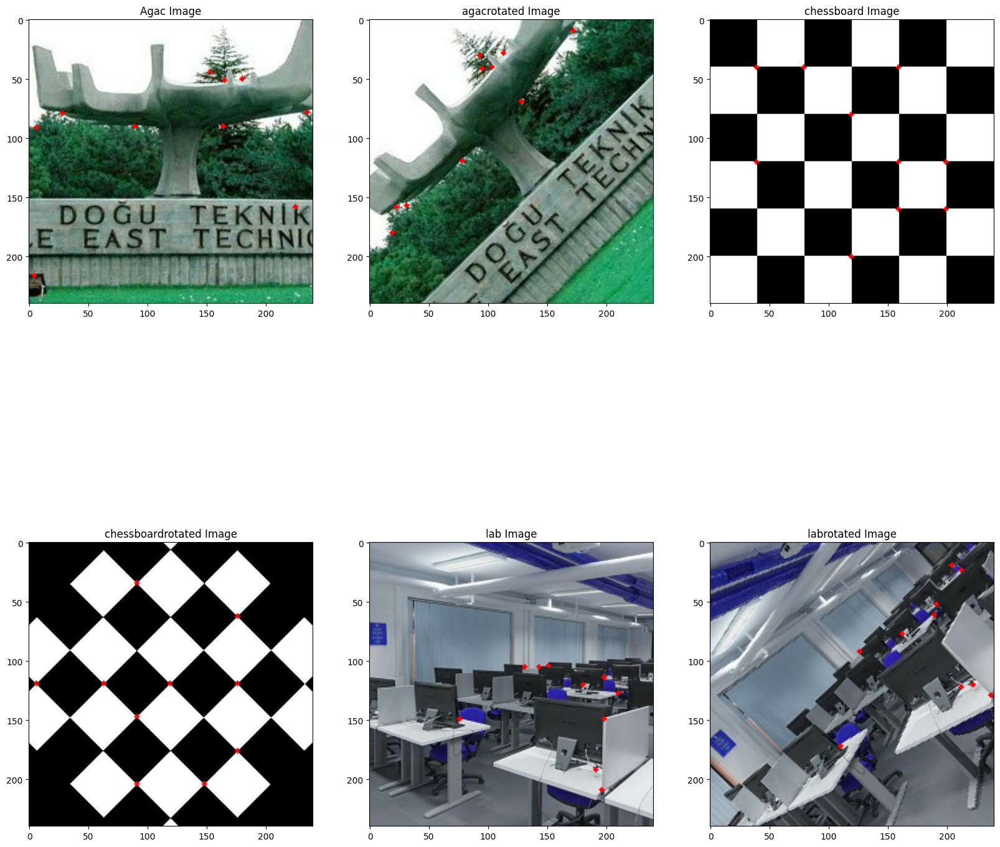

In [24]:
# implement harris corner detection algorithm

import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import time

# read the all image
img = cv2.imread('agac.png')
img2 = cv2.imread('agacrotated.png')
img3 = cv2.imread('chessboard.png')
img4 = cv2.imread('chessboardrotated.png')
img5 = cv2.imread('lab.png')
img6 = cv2.imread('labrotated.png')

# define the gaussian kernel function with cv2

def r_function_gauss(img):
    # copy image
    img = img.copy()
    # convert image to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # create the sobel filter
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    # apply the sobel filter to image
    Ix = scipy.signal.convolve2d(gray, sobel_x, mode='same', boundary='symm')
    Iy = scipy.signal.convolve2d(gray, sobel_y, mode='same', boundary='symm')
    # calculate the taylor matrix
    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy
    # create a new image to store the result
    result_img = np.zeros(gray.shape)
    # iterate over the window
    # do the haris corner detection with faster way
    x2_conv = scipy.signal.convolve2d(Ix2, np.ones((3, 3)), mode='same')
    y2_conv = scipy.signal.convolve2d(Iy2, np.ones((3, 3)), mode='same')
    xy_conv = scipy.signal.convolve2d(Ixy, np.ones((3, 3)), mode='same')
    # create the gaussian kernel with size=3 and sigma=1 and then convelve x2_conv, y2_conv, xy_conv
    gaussian_kernel = cv2.getGaussianKernel(3, 1)
    x2_conv = scipy.signal.convolve2d(x2_conv, gaussian_kernel, mode='same')
    y2_conv = scipy.signal.convolve2d(y2_conv, gaussian_kernel, mode='same')
    xy_conv = scipy.signal.convolve2d(xy_conv, gaussian_kernel, mode='same')

    # do the haris corner detection with faster way without using for loop
    result_img = x2_conv * y2_conv - xy_conv ** 2 - 0.04 * (x2_conv + y2_conv) ** 2
    # take the len of result image
    len_result = len(result_img)
    for i in range(0,len_result-8):
        for j in range(0,len_result-8):
            max_val = np.max(result_img[i:i+8, j:j+8])
            # keep maximum value in the 8x8 window and assign 0 to the rest
            result_img[i:i + 8, j:j + 8][result_img[i:i + 8, j:j + 8] < max_val] = 0
            # iterate over the window take the maximum value index and store them
            if np.count_nonzero(result_img[i:i + 8, j:j + 8]) > 1:
                flag = True
                for k in range(0,8):
                    for l in range(0,8):
                        if result_img[i+k,j+l] == max_val and flag:
                            flag = False
                            continue
                        else:
                            result_img[i+k,j+l] = 0

    # take 10 largest values of the result image and take the coordinates of them
    # get the coordinates of the 10 largest values
    coordinates = np.unravel_index(np.argsort(result_img.ravel())[-10:], result_img.shape)
    # draw 10 circles on the image with the coordinates
    for i in range(10):
        cv2.circle(img, (coordinates[1][i], coordinates[0][i]), 2, (255, 0, 0), -1)

    return img


# add all image to one figure
plt.figure(figsize=(20, 20))
plt.subplot(2, 3, 1)
plt.title('Agac Image')
start_time = time.time()
plt.imshow(r_function_gauss(img))
print("The run time of the agac.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 2)
plt.title('agacrotated Image')
start_time = time.time()
plt.imshow(r_function_gauss(img2))
print("The run time of the agacrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 3)
plt.title('chessboard Image')
start_time = time.time()
plt.imshow(r_function_gauss(img3))
print("The run time of the chessboard.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 4)
plt.title('chessboardrotated Image')
start_time = time.time()
plt.imshow(r_function_gauss(img4))
print("The run time of the chessboardrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 5)
plt.title('lab Image')
start_time = time.time()
plt.imshow(r_function_gauss(img5))
print("The run time of the lab.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))
plt.subplot(2, 3, 6)
plt.title('labrotated Image')
start_time = time.time()
plt.imshow(r_function_gauss(img6))
print("The run time of the labrotated.png is %s seconds." % (time.time() - start_time).__format__('0.3f'))



# This part is for discussion
In this task, I implemented the R function with fast windowing based on filtering with non-maximum suppression. Instead of uniform weighting, I used gaussian weighting. Again because of the non-maximum suppression the corners are not very close to each other. The speed is increased very little compared to Task 6. Since we used the gaussian weighting, the algorithm gives us rotation invariant results. Also, I want to state that this is the best computational speed I get.
